In [1]:
from sklearn.model_selection import train_test_split
import numpy as np
import pywt
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LogisticRegression
from glob import glob
import scipy
from scipy.signal import butter, lfilter, convolve, boxcar
from scipy.signal import freqz
from scipy.fftpack import fft, ifft
import os

from sklearn.preprocessing import StandardScaler

In [2]:
def wavelet_denoising(x, wavelet='db2', level=3):
    coeff = pywt.wavedec(x, wavelet, mode="per")
    sigma = (1/0.6745) * madev(coeff[-level])
    uthresh = sigma * np.sqrt(2 * np.log(len(x)))
    coeff[1:] = (pywt.threshold(i, value=uthresh, mode='hard') for i in coeff[1:])
    return pywt.waverec(coeff, wavelet, mode='per')

In [3]:
def madev(d, axis=None):
    """ Mean absolute deviation of a signal """
    return np.mean(np.absolute(d - np.mean(d, axis)), axis)

In [4]:
def prepare_data_train(fname):
    """ read and prepare training data """
    # Read data
    data = pd.read_csv(fname)
    # events file
    events_fname = fname.replace('_data','_events')
    # read event file
    labels= pd.read_csv(events_fname)
    clean=data.drop(['id' ], axis=1)#remove id
    labels=labels.drop(['id' ], axis=1)#remove id
    return  clean,labels


In [5]:
def prepare_data_test(fname):
    """ read and prepare test data """
    # Read data
    data = pd.read_csv(fname)
    return data

In [6]:
scaler= StandardScaler()
def data_preprocess_train(X):
    X_prep=scaler.fit_transform(X)
    #do here your preprocessing
    return X_prep
def data_preprocess_test(X):
    X_prep=scaler.transform(X)
    #do here your preprocessing
    return X_prep

In [7]:
subjects = range(1,6)

ids_tot = []
pred_tot = []
X_train_butter = []


In [8]:
y_raw= []
raw = []
y_rawt= []
rawt = []

In [9]:
for subject in subjects:
    
    ################ READ DATA ################################################
    fnames =  sorted(glob('../raw_date/train/subj%d_series*_data.csv' % (subject)))


#    fnames =  glob('../input/train/subj1_series1_events.csv')
#    fnames =  glob('../input/train/subj1_series1_data.csv')
    for fname in fnames:
        data,labels=prepare_data_train(fname)
        
        raw.append(data)
        y_raw.append(labels)

    for fname in fnames:
        with open(fname) as myfile:
            head = [next(myfile) for x in range(10)]
            
        

      

In [10]:
X = pd.concat(raw)
y = pd.concat(y_raw)

In [11]:
X_train =np.asarray(X.astype(float))
y_train = np.asarray(y.astype(float))

In [12]:
fs= 500.0
lowcut = 7.0
highcut = 30.0

In [15]:
#x_train_butter=wavelet_denoising(X_train[:2000000])

In [16]:
#x_train=data_preprocess_train(x_train_butter)

In [25]:
#X1_train,xtest,y1_train, ytest = train_test_split(x_train,y_train[:2000000], test_size=0.3)


In [68]:
x_train_butter=wavelet_denoising(X_train)
x_train=data_preprocess_train(x_train_butter)

splitrate=-x_train.shape[0]//5*2
xval=x_train[splitrate:splitrate//2]
yval=y_train[splitrate:splitrate//2]
xtest=x_train[splitrate//2:]
ytest=y_train[splitrate//2:]
xtrain=x_train[:splitrate]
ytrain=y_train[:splitrate]

In [88]:
splitrate//2

-1478193

In [85]:
xval.shape,yval.shape,xtrain.shape,ytrain.shape,xtest.shape,ytest.shape


((1478193, 32),
 (1478193, 6),
 (4434575, 32),
 (4434575, 6),
 (1478193, 32),
 (1478193, 6))

In [30]:
signal=pd.read_csv('../raw_date/train/subj1_series1_data.csv')
signal = signal.drop("id", axis=1)
filtered = wavelet_denoising(signal, wavelet='db2', level=3)

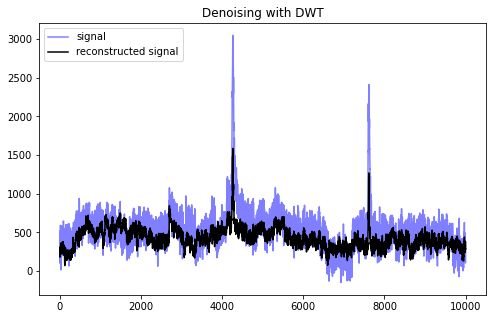

In [31]:

import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(signal.iloc[:10000,1], label='signal', color="b", alpha=0.5,)
ax.plot(filtered[:10000,1], label='reconstructed signal',color="k")
ax.legend(loc='upper left')
ax.set_title('Denoising with DWT')
plt.show()

In [69]:
ye=pd.DataFrame(y_train)

In [70]:
ye.columns=["Handstart ","Grasping ","Lift ","Hold ","Replace ","Release"]

In [71]:
categories = list(ye.columns.values)

In [72]:

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import LSTM, BatchNormalization, Conv2D, Flatten, MaxPooling2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import roc_curve, auc, roc_auc_score

In [115]:
load = 1
time_steps = 1000
subsample = 50

model = Sequential()

model.add(Conv2D(filters = 64, kernel_size = (7,7), padding = "same", activation = "relu", input_shape = ((time_steps//subsample), 32, 1)))
model.add(BatchNormalization())
#model.add(MaxPooling2D(pool_size = (3,3)))
model.add(Conv2D(filters = 64, kernel_size = (5,5), padding = "same", activation = "relu", input_shape = ((time_steps//subsample), 32, 1)))
model.add(BatchNormalization())
#model.add(MaxPooling2D(pool_size = (3,3)))
model.add(Conv2D(filters = 64, kernel_size = (3,3), padding = "same", activation = "relu", input_shape = ((time_steps//subsample), 32, 1)))
model.add(BatchNormalization())
#model.add(MaxPooling2D(pool_size = (3,3)))
model.add(Flatten())
#model.add(Dropout(0.2))
model.add(Dense(32, activation = "relu"))
model.add(BatchNormalization())
# model.add(Dropout(0.2))
model.add(Dense(6, activation = "sigmoid"))


adam = Adam(lr = 0.0001)

model.compile(optimizer = adam, loss = "binary_crossentropy", metrics = ['accuracy','mse'])

model.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 20, 32, 64)        3200      
_________________________________________________________________
batch_normalization_16 (Batc (None, 20, 32, 64)        256       
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 20, 32, 64)        102464    
_________________________________________________________________
batch_normalization_17 (Batc (None, 20, 32, 64)        256       
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 20, 32, 64)        36928     
_________________________________________________________________
batch_normalization_18 (Batc (None, 20, 32, 64)        256       
_________________________________________________________________
flatten_4 (Flatten)          (None, 40960)            

In [74]:
 (4434575, 32),
def valgenerator():
    while 1:
        batch_size=32
        x_time_data = np.zeros((batch_size, time_steps//subsample, 32))
        print(x_time_data)
        yy = []
        for i in range(batch_size):
            random_index = np.random.randint(0, len(xval)-time_steps)
            x_time_data[i] = xval[random_index:random_index+time_steps:subsample]
            yy.append(yval[random_index + time_steps])
        yy = np.asarray(yy)
        yield x_time_data.reshape((x_time_data.shape[0],x_time_data.shape[1], x_time_data.shape[2],1)), yy

In [116]:
x_time_data = np.zeros((32, time_steps//subsample, 32))
yy = []


In [117]:
random_index = np.random.randint(0, len(xval)-time_steps)
print(random_index)

826009


In [118]:
yval[random_index + time_steps].shape

(6,)

In [119]:
xval[random_index:random_index+time_steps:subsample].shape

(20, 32)

In [120]:
random_index = np.random.randint(0, len(xval)-time_steps)

In [121]:
x_time_data[0] = xval[random_index:random_index+time_steps:subsample]

In [122]:
yy.append(yval[random_index + time_steps])
yy = np.asarray(yy)

In [123]:
x_time_data.reshape((x_time_data.shape[0],x_time_data.shape[1], x_time_data.shape[2],1)).shape

(32, 20, 32, 1)

In [77]:
import time
from tensorflow.keras.callbacks import EarlyStopping
start=time.time()
def generator(batch_size):
    while 1:
        
        x_time_data = np.zeros((batch_size, time_steps//subsample, 32))
        yy = []
        for i in range(batch_size):
            random_index = np.random.randint(0, len(xtrain)-time_steps)
            x_time_data[i] = xtrain[random_index:random_index+time_steps:subsample]
            yy.append(ytrain[random_index + time_steps])
        yy = np.asarray(yy)
        yield x_time_data.reshape((x_time_data.shape[0],x_time_data.shape[1],  x_time_data.shape[2],1)), yy
        
es= EarlyStopping(patience=2)
history =model.fit_generator(generator(32), steps_per_epoch = 600, epochs = 50,validation_data=valgenerator(),
                              validation_steps=200,callbacks=[es])
#print('training time taken: ',round(time.time()-start,0),'seconds')

Epoch 1/50
600/600 [==============================] - ETA: 0s - loss: 0.3884 - accuracy: 0.1214 - mse: 0.1063[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. .

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

Epoch 5/50
600/600 [==============================] - ETA: 0s - loss: 0.1208 - accuracy: 0.2189 - mse: 0.0254[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. .

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

Epoch 6/50
600/600 [==============================] - ETA: 0s - loss: 0.1130 - accuracy: 0.2433 - mse: 0.0249[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. .

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0

  [0. 0. 0. ... 0. 0. 0.]]]
[[[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 ...

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]]

 [[0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  ...
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0. ... 0. 0. 0.]
  [0. 0. 0

600/600 [==============================] - 120s 201ms/step - loss: 0.1057 - accuracy: 0.2879 - mse: 0.0244 - val_loss: 0.1167 - val_accuracy: 0.2252 - val_mse: 0.0268


In [93]:
for i in generator(32):
    print(i[0].shape)

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20, 32, 1)
(32, 20,

KeyboardInterrupt: 